# Реализация методов кросс-валидации

В данном разделе вам предлагается реализовать методы кросс-валидации, описанные в статье https://arxiv.org/pdf/1905.11744.pdf, которую мы разбирали на семинаре. Реализуйте все методы, перечисленные в классе. В случае, если в классе понадобятся дополнительные параметры, доопределите их самостоятельно.


0.7 балла за каждый из девяти методов оценки ошибки (Максимум 6.3)

Ещё 0.7 за реализацию оставшихся методов класса и функции model_fit.

Итого, максимум 7 баллов за раздел

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import kpss
from sklearn.linear_model import LinearRegression
from scipy.ndimage.interpolation import shift
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)
np.warnings.filterwarnings('ignore')

In [2]:
def mape(x, y):    # mean absolute percent error
    return (np.abs((x - y) / y)).mean()

In [3]:
def model_fit(X_train, y_train, X_test, y_test):
    """Функция, возвращающая ошибку на тесте для авторегрессии"""
    model = LinearRegression().fit(X_train, y_train)
    pred = np.array(model.predict(X_test))
    return mape(pred, np.array(y_test))

class CVMethods:
    def __init__(self, ts, proportion, nfolds, cv_gap, p, nreps):

        breakpoint = int(len(ts)*proportion)
        # Разбиваем ряд на оценку и валидацию
        self.est = ts[:breakpoint]
        self.val = ts[breakpoint:]

        # Устанавливаем количество фолдов для prequential и cv методов.
        self.nfolds = nfolds

        # Устанавливаем длину разрыва (в точках) для cv_hv_blocked
        self.cv_gap = cv_gap

        # Устанавливаем порядок авторегрессии для этого ряда
        self.p = p

        # Устанавливаем количество повторов rep_holdout
        self.nreps = nreps


    def get_Lm(self):
        """Метод, возвращающий 'истинную' ошибку модели.
         Банально обучаем авторегрессию на всей части est и прогнозируем на val."""
        
        X_train = pd.DataFrame()
        X_test = pd.DataFrame()
        for i in range(1, self.p + 1):
            if isinstance(self.est, np.ndarray):
                X_train['lag' + str(i)] = shift(self.est, i, cval=np.NaN)
                X_test['lag' + str(i)] = shift(self.val, i, cval=np.NaN)
            else:
                X_train['lag' + str(i)] = self.est.shift(i)
                X_test['lag' + str(i)] = self.val.shift(i)
        X_train.dropna(inplace=True)
        X_test.dropna(inplace=True)
        y_train = self.est[self.p:]
        y_test = self.val[self.p:]
        return model_fit(X_train, y_train, X_test, y_test)
        
    def get_all_metrics(self):
        """Метод, возвращающий вектор из всех нижеперечисленных метрик"""    # для удобства верну словарь
        return {'holdout': self.get_holdout(), 'rep_holdout': self.get_rep_holdout(),
               'preq_expanding': self.get_preq_expanding(), 'preq_sliding': self.get_preq_sliding(), 'preq_expanding_with_gap': self.get_preq_expanding_with_gap(),
               'cv_blocked': self.get_cv_blocked(), 'cv_hv_blocked': self.get_cv_hv_blocked(), 
                'simple_expanding': self.get_simple_expanding(), 'simple_sliding': self.get_simple_sliding()}
    
    # Все методы ниже возвращают свою оценку ошибки на части est. В статье они проименованы как \hat{g}_i
    def get_holdout(self):
        train = self.est.head(int(len(self.est)*0.8))
        test = self.est.tail(len(self.est) - len(train))
        X_train = pd.DataFrame()
        X_test = pd.DataFrame()
        for i in range(1, self.p + 1):
            if isinstance(train, np.ndarray):
                X_train['lag' + str(i)] = shift(train, i, cval=np.NaN)
                X_test['lag' + str(i)] = shift(test, i, cval=np.NaN)
            else:
                X_train['lag' + str(i)] = train.shift(i)
                X_test['lag' + str(i)] = test.shift(i)
        X_train.dropna(inplace=True)
        X_test.dropna(inplace=True)
        y_train = train[self.p:]
        y_test = test[self.p:]
        return model_fit(X_train, y_train, X_test, y_test)

    def get_rep_holdout(self):
        window_width = len(self.est) / self.nfolds    # width of available window = width of fold
        r = len(self.est) - (window_width // 2)
        error = 0
        for i in range(self.nreps):
            split_point = np.random.randint(r-window_width, r)    # choose split point in available window
            train = self.est[:split_point]
            test = self.est[split_point:]
            X_train = pd.DataFrame()
            X_test = pd.DataFrame()
            for i in range(1, self.p + 1):
                if isinstance(train, np.ndarray):
                    X_train['lag' + str(i)] = shift(train, i, cval=np.NaN)
                    X_test['lag' + str(i)] = shift(test, i, cval=np.NaN)
                else:
                    X_train['lag' + str(i)] = train.shift(i)
                    X_test['lag' + str(i)] = test.shift(i)
            X_train.dropna(inplace=True)
            X_test.dropna(inplace=True)
            y_train = train[self.p:]
            y_test = test[self.p:]
            error += model_fit(X_train, y_train, X_test, y_test)
        return error / self.nreps

    def get_preq_expanding(self):
        preq_error = 0
        fold_width = len(self.est) // self.nfolds
        for i in range(1, self.nfolds):
            train = self.est[:fold_width * i]
            test = self.est[fold_width * i : min(fold_width * (i + 1), len(self.est))]
            X_train = pd.DataFrame()
            X_test = pd.DataFrame()
            for i in range(1, self.p + 1):
                if isinstance(train, np.ndarray):
                    X_train['lag' + str(i)] = shift(train, i, cval=np.NaN)
                    X_test['lag' + str(i)] = shift(test, i, cval=np.NaN)
                else:
                    X_train['lag' + str(i)] = train.shift(i)
                    X_test['lag' + str(i)] = test.shift(i)
            X_train.dropna(inplace=True)
            X_test.dropna(inplace=True)
            y_train = train[self.p:]
            y_test = test[self.p:]
            preq_error += model_fit(X_train, y_train, X_test, y_test)
        return preq_error / (self.nfolds - 1)

    def get_preq_sliding(self):
        preq_error = 0
        fold_width = len(self.est) // self.nfolds
        for i in range(1, self.nfolds):
            train = self.est[fold_width * (i - 1) : fold_width * i]
            test = self.est[fold_width * i : min(fold_width * (i + 1), len(self.est))]
            X_train = pd.DataFrame()
            X_test = pd.DataFrame()
            for i in range(1, self.p + 1):
                if isinstance(train, np.ndarray):
                    X_train['lag' + str(i)] = shift(train, i, cval=np.NaN)
                    X_test['lag' + str(i)] = shift(test, i, cval=np.NaN)
                else:
                    X_train['lag' + str(i)] = train.shift(i)
                    X_test['lag' + str(i)] = test.shift(i)
            X_train.dropna(inplace=True)
            X_test.dropna(inplace=True)
            y_train = train[self.p:]
            y_test = test[self.p:]
            preq_error += model_fit(X_train, y_train, X_test, y_test)
        return preq_error / (self.nfolds - 1)

    def get_preq_expanding_with_gap(self):
        preq_error = 0
        fold_width = len(self.est) // self.nfolds
        for i in range(1, self.nfolds - 1):
            train = self.est[:fold_width * i]
            test = self.est[fold_width * (i + 1) : min(fold_width * (i + 2), len(self.est))]
            X_train = pd.DataFrame()
            X_test = pd.DataFrame()
            for i in range(1, self.p + 1):
                if isinstance(train, np.ndarray):
                    X_train['lag' + str(i)] = shift(train, i, cval=np.NaN)
                    X_test['lag' + str(i)] = shift(test, i, cval=np.NaN)
                else:
                    X_train['lag' + str(i)] = train.shift(i)
                    X_test['lag' + str(i)] = test.shift(i)
            X_train.dropna(inplace=True)
            X_test.dropna(inplace=True)
            y_train = train[self.p:]
            y_test = test[self.p:]
            preq_error += model_fit(X_train, y_train, X_test, y_test)
        return preq_error / (self.nfolds - 2)

    def get_cv_blocked(self):
        cv_error = 0
        fold_width = len(self.est) // self.nfolds
        for i in range(self.nfolds):
            test = self.est[fold_width * i : min(fold_width * (i + 1), len(self.est))]
            train = np.concatenate([self.est[:fold_width * i], self.est[min(fold_width * (i + 1), len(self.est)):]])
            X_train = pd.DataFrame()
            X_test = pd.DataFrame()
            for i in range(1, self.p + 1):
                if isinstance(train, np.ndarray):
                    X_train['lag' + str(i)] = shift(train, i, cval=np.NaN)
                    X_test['lag' + str(i)] = shift(test, i, cval=np.NaN)
                else:
                    X_train['lag' + str(i)] = train.shift(i)
                    X_test['lag' + str(i)] = test.shift(i)
            X_train.dropna(inplace=True)
            X_test.dropna(inplace=True)
            y_train = train[self.p:]
            y_test = test[self.p:]
            cv_error += model_fit(X_train, y_train, X_test, y_test)
        return cv_error / self.nfolds

    def get_cv_hv_blocked(self):
        cv_error = 0
        fold_width = len(self.est) // self.nfolds
        for i in range(self.nfolds):
            test = self.est[fold_width * i : min(fold_width * (i + 1), len(self.est))]
            train = np.concatenate([self.est[:max(fold_width * i - self.cv_gap, 0)], 
                                    self.est[min(fold_width * (i + 1) + self.cv_gap, len(self.est)):]])
            X_train = pd.DataFrame()
            X_test = pd.DataFrame()
            for i in range(1, self.p + 1):
                if isinstance(train, np.ndarray):
                    X_train['lag' + str(i)] = shift(train, i, cval=np.NaN)
                    X_test['lag' + str(i)] = shift(test, i, cval=np.NaN)
                else:
                    X_train['lag' + str(i)] = train.shift(i)
                    X_test['lag' + str(i)] = test.shift(i)
            X_train.dropna(inplace=True)
            X_test.dropna(inplace=True)
            y_train = train[self.p:]
            y_test = test[self.p:]
            cv_error += model_fit(X_train, y_train, X_test, y_test)
        return cv_error / self.nfolds

    def forcv(self, ts):
        train = ts.head(int(len(ts)*0.8))
        test = ts.tail(len(ts) - len(train))
        X_train = pd.DataFrame()
        X_test = pd.DataFrame()
        for i in range(1, self.p + 1):
            if isinstance(train, np.ndarray):
                X_train['lag' + str(i)] = shift(train, i, cval=np.NaN)
                X_test['lag' + str(i)] = shift(test, i, cval=np.NaN)
            else:
                X_train['lag' + str(i)] = train.shift(i)
                X_test['lag' + str(i)] = test.shift(i)
        X_train.dropna(inplace=True)
        X_test.dropna(inplace=True)
        y_train = train[self.p:]
        y_test = test[self.p:]
        return model_fit(X_train, y_train, X_test, y_test)
        
    def get_simple_expanding(self):
        """Метод расширяющегося окна с шагом по одному наблюдению"""
        fold_width = self.est.shape[0] // self.nfolds
        return np.mean(self.est.expanding(self.est.shape[0] - fold_width).apply(lambda x : self.forcv(x)))

    def get_simple_sliding(self):
        """Метод сдвигающегося окна с шагом по одному наблюдению"""
        fold_width = self.est.shape[0] // self.nfolds
        return np.mean(self.est.rolling(self.est.shape[0] - fold_width).apply(lambda x : self.forcv(x)))

# Тестирование результатов

## Героическая загрузка данных и формирование набора из 10 рядов (1 балл)

Подберите 10 любых рядов. Из них 5 нестационарных, 5 стационарных. Желательно, чтобы они были относительно разнообразными (лучше не брать ВВП и потребление из предыдущего ДЗ, но можно, если совсем всё плохо.) Самый простой способ -- взять 5 нестационарных рядов и сделать из них ещё 5 стационарных путём взятия разностей. Например, можно взять ряды из датасетов M3 или M4. Я когда-то для курсача сэмплировал небольшую подборку рядов из M4, можете использовать их либо найти любые другие данные. Сэмпл лежит в папке с заданием. Если не хотите слишком долго считать, избегайте слишком длинных рядов, в частности с часовой периодичностью.

*Будем проверять стационарность KPSS-тестом, данные будем рассматривать с месячной периодичностью.*

In [4]:
def is_stationary(ts, regression='c'):
    kpss_0 = kpss(ts, regression=regression)
    return not (kpss_0[0] > kpss_0[3]['5%'])

In [5]:
monthly_data = pd.read_csv('Monthly_sample.csv')
monthly_data = monthly_data.iloc[:,1:1000]     # keep 1000 datapoints
monthly_data

,0,1,2,3,4,5,6,7,8,9,...,989,990,991,992,993,994,995,996,997,998
0,0.441534,-1.554492,-1.415969,-1.395502,-1.219376,-2.148917,-1.740608,-1.125086,-2.783936,-2.430113,...,-1.207860,-1.147150,-1.032445,-2.130322,-1.416839,-0.319596,-1.125658,-1.396956,-1.451404,-1.511626
1,0.142399,-1.554492,-1.400263,-0.644186,-1.300279,-2.098923,-1.605866,-1.103201,-2.442171,-2.946382,...,-1.207860,-1.154307,-1.812020,-2.230936,-1.307739,-0.648768,-0.906272,-1.446882,-1.477194,-1.840669
2,0.484267,-1.554492,-1.364874,-0.281024,-1.280053,-2.094887,-1.564857,-0.962383,-2.073065,-2.300962,...,-1.207860,-1.161464,-1.172080,-2.080014,-1.301905,-0.395559,-0.655546,-1.396956,-1.442808,-1.950349
3,0.180385,-1.604534,-1.350683,-0.874737,-1.421633,-2.032281,-1.394965,-0.749860,-1.991042,-1.505902,...,-1.063730,-1.161464,-1.613335,-1.853631,-1.440175,-0.547485,-0.968954,-1.421919,-1.362573,-1.072903
4,0.693187,-1.604534,-1.331333,-0.881484,-1.340730,-1.996070,-1.476982,-1.404994,-1.792818,-1.599672,...,-1.063730,-1.154307,-1.937390,-1.727863,-2.105859,0.085539,-0.796579,-1.396956,-1.394094,-0.469659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151,-0.137742,-0.053249,1.870472,0.547551,0.580711,0.893155,1.329171,0.269270,0.661052,1.021148,...,1.818873,2.037873,0.829821,1.340884,0.693980,1.149020,1.052529,0.575104,1.944237,0.078745
152,-0.237454,-0.053249,1.895006,-0.878337,0.600937,0.879961,1.434621,1.175227,1.194204,1.302968,...,1.818873,2.123762,0.787574,1.114501,0.881841,1.275625,2.619570,1.049398,2.010144,0.736830
153,0.199377,-0.103291,1.904809,-2.076206,0.661614,0.791532,1.575222,1.094019,1.385593,1.311992,...,2.251263,2.266909,0.864499,1.114501,1.394085,1.427550,1.021188,1.224137,2.055993,0.736830
154,1.469512,-0.003208,1.900190,-3.150916,0.944774,1.061283,1.680672,2.330566,1.358252,0.774585,...,2.251263,2.259751,0.968232,1.215115,1.817066,1.579476,1.961413,1.149249,2.356872,1.614276


*Посмотрим на графики рядов для выбора параметра при тестировании на стационарность ('c','ct',etc). 156 рядов на одном графике, конечно, не очень красиво, но оставлю так, потому что в plotly всё-таки можно рассматривать ряды по-отдельности. В целом можно увидеть, что во всех рядах не наблюдается тренд, похоже, что данные находятся около одной константы, поэтому будем тестировать с параметром 'c'.*

In [6]:
fig = go.Figure()

for i in range(monthly_data.shape[0]):
    fig.add_trace(go.Scatter(y = monthly_data.iloc[i,:]))
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(
    title={
        'text': "Monthly time series",
    })
fig.show()

*Возьмём нестационарные ряды из всех рассматриваемых:*

In [7]:
stat_idx = []
for i in range(monthly_data.shape[0]):
    if not is_stationary(monthly_data.iloc[i,:], 'c'):
        stat_idx.append(i)

In [8]:
non_stationary_ts = []
for idx in stat_idx:
    non_stationary_ts.append(monthly_data.loc[idx,:])

*Каждый нестационарный ряд преобразуем в стационарный, итого получается по 7 рядов.*

In [9]:
def make_stationary(ts):
    while not is_stationary(ts):
        ts = ts.diff().dropna()
    return ts

In [10]:
stationary_ts = []
for non_stat_ts in non_stationary_ts:
    stationary_ts.append(make_stationary(non_stat_ts))

## Графики и интерпретация результатов

### (По 1 баллу за каждый из двух графиков и анализ полученного результата, всего - 2)

На каждом ряде посчитайте абсолютную ошибку каждого алгоритма относительно Lm. Параметр p для каждого ряда определите по автокорреляциям. Если ряд нестационарный -- по автокорреляциям его стационарных разностей. (Особо у нас просто нет более простых вариантов).

Для каждого ряда постройте рейтинг метрик по ошибке от меньшего к большему. Если holdout ошибся меньше всего, ему будет присвоен рейтинг 1. Успредните отдельно по стационарным и нестационарным рядам и нарисуйте два bar-chart как в статье (напр. на странице 16). Совпали ли результаты с выводами статьи, которые мы обсуждали? Наблюдается ли разница между стационарными и нестационарными рядами?

(Я понимаю, что усреднять по 5 точкам не очень хорошо, но будем считать что 5 точек это очень много. Если хотите получить более валидные результаты, можете взять больше рядов если не лень тестировать стационарность по каждому. Я решил не усложнять муторной работой это дз.)

*Нарисуем для стационарных рядов графики их частных автокорреляций, по ним выберем значения p. (Для нестационарных рядов будут те же значения):*

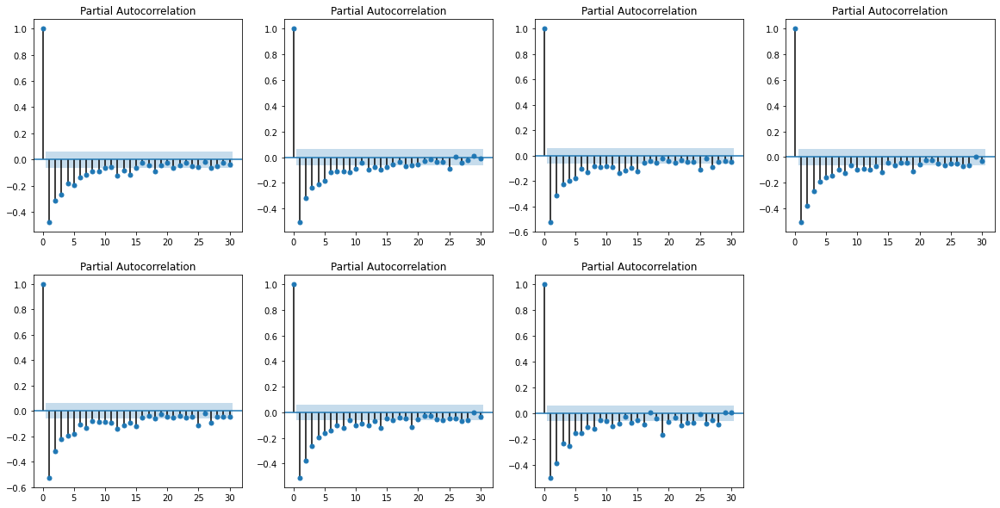

In [11]:
fig, ax = plt.subplots(2,4,figsize=(20,10))
for i in range(2):
    for j in range(4):
        ts = stationary_ts[i * 2 + j]
        plot_pacf(ts, ax=ax[i][j])
fig.delaxes(ax[1][3])

*По получившимся графикам выберем p = (10, 10, 15, 14, 15, 15, 9)*

In [12]:
p = [10, 10, 15, 14, 15, 15, 9]

In [13]:
# CVMethods for each time series
cv_non_st = []
for i in range(len(non_stationary_ts)):
    cv_non_st.append(CVMethods(non_stationary_ts[i], 0.7, 5, 50, p[i], 10))

cv_st = []
for i in range(len(stationary_ts)):
    cv_st.append(CVMethods(stationary_ts[i], 0.7, 5, 50, p[i], 10))

*Выведем и сохраним ошибку Lm для каждого ряда:*

In [14]:
ns_lm = []
s_lm = []
print('Lm for non stationary series:')
for i in range(len(non_stationary_ts)):
    ns_lm.append(cv_non_st[i].get_Lm())
    print("%.4f" % cv_non_st[i].get_Lm(), end=' ')
print()
print('Lm for stationary series:')
for i in range(len(stationary_ts)):
    s_lm.append(cv_st[i].get_Lm())
    print("%.4f" % cv_st[i].get_Lm(), end=' ')

Lm for non stationary series:
1.6788 1.3715 1.8588 1.5985 1.8417 1.2402 1.4440 
Lm for stationary series:
4.7716 6.2324 7.9644 1.2288 1.9952 1.9849 2.4878 

*Получим все метрики для всех рядов, посчитаем абсолютные ошибки относительно Lm:*

In [15]:
ns_all = []
for cv in cv_non_st:
    ns_all.append(cv.get_all_metrics())
s_all = []
for cv in cv_st:
    s_all.append(cv.get_all_metrics())

In [16]:
ns_errors = []
for i in range(len(ns_all)):
    ns_errors.append({item: abs(ns_all[i][item] - ns_lm[i]) for item in ns_all[i]})

s_errors = []
for i in range(len(s_all)):
    s_errors.append({item: abs(s_all[i][item] - s_lm[i]) for item in s_all[i]})

*Выведем в порядке возрастания абсолютной ошибки методы для каждого ряда:*

In [17]:
print('Performance rating of different cv methods',end='\n\n')
for i in range(len(ns_errors)):
    print(f'non stationary {i}', '\t\t\t\t', f'stationary {i}')
    for item_ns, item_s in zip(sorted(ns_errors[i].items(), key = lambda item: item[1]), 
                               sorted(s_errors[i].items(), key = lambda item: item[1])):
        print('\t', item_ns[0], '%.4f' % item_ns[1], '\t\t\t\t', item_s[0], '%.4f' % item_s[1])

Performance rating of different cv methods

non stationary 0 				 stationary 0
	 cv_blocked 0.2592 				 preq_expanding_with_gap 2.3428
	 cv_hv_blocked 0.2972 				 simple_expanding 3.0954
	 preq_sliding 0.4532 				 simple_sliding 3.1267
	 preq_expanding 0.5367 				 rep_holdout 3.3098
	 preq_expanding_with_gap 0.8573 				 holdout 3.4011
	 simple_sliding 1.1384 				 preq_sliding 9.7323
	 simple_expanding 1.1612 				 preq_expanding 9.7948
	 rep_holdout 2.1392 				 cv_blocked 10.9323
	 holdout 3.0171 				 cv_hv_blocked 14.0931
non stationary 1 				 stationary 1
	 preq_sliding 0.0392 				 preq_sliding 3.9220
	 simple_sliding 0.0946 				 preq_expanding 3.9439
	 holdout 0.1267 				 cv_blocked 4.0180
	 simple_expanding 0.1488 				 cv_hv_blocked 4.0731
	 cv_blocked 0.1497 				 preq_expanding_with_gap 4.2505
	 cv_hv_blocked 0.2000 				 simple_expanding 4.3566
	 preq_expanding 0.2491 				 simple_sliding 4.3913
	 rep_holdout 0.2665 				 holdout 4.4289
	 preq_expanding_with_gap 0.8857 				 rep_holdo

In [18]:
# create dictionary of rankings for each method
ns_ranking = {}
for ns in ns_errors:
    for j in range(9):
        name = sorted(ns.items(), key = lambda item: item[1])[j][0]
        if name in ns_ranking:
            ns_ranking[name].append(j + 1)
        else:
            ns_ranking[name] = [j + 1]

s_ranking = {}
for s in s_errors:
    for j in range(9):
        name = sorted(s.items(), key = lambda item: item[1])[j][0]
        if name in s_ranking:
            s_ranking[name].append(j + 1)
        else:
            s_ranking[name] = [j + 1]

In [19]:
# calculate average rank and std for each method
for item in ns_ranking:
    ns_ranking[item] = (np.mean(ns_ranking[item]), np.std(ns_ranking[item]))
    
for item in s_ranking:
    s_ranking[item] = (np.mean(s_ranking[item]), np.std(s_ranking[item]))

In [20]:
# sort in ascending order of average rank
ns_ranking = dict(sorted(ns_ranking.items(), key = lambda item: item[1][0]))
s_ranking = dict(sorted(s_ranking.items(), key = lambda item: item[1][0]))

*Построим нужные bar-chart-ы:*

In [21]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=list(ns_ranking.keys()), y=[x[0] for x in list(ns_ranking.values())],
    error_y=dict(type='data', array=[x[1] for x in list(ns_ranking.values())])
))
fig.update_layout(
    yaxis_title="avg. rank and std. deviation",
    title={
        'text': "CV methods ranking for non stationary time series",
    })

fig.show()

In [22]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=list(s_ranking.keys()), y=[x[0] for x in list(s_ranking.values())],
    error_y=dict(type='data', array=[x[1] for x in list(s_ranking.values())])
))
fig.update_layout(
    yaxis_title="avg. rank and std. deviation",
    title={
        'text': "CV methods ranking for stationary time series",
    })

fig.show()

*По графикам можно увидеть, что для нестационарных рядов лучше всего сработали кросс-валидационные методы (CV-Blocked, CV-hv-Blocked) и хуже всего сработали baseline-методы (holdout, prequential). В статье это объясняется тем, что нестационарные ряды имеют слабую структуру и поэтому взятие данных как от предыдущих, так и последующих моментов времени для обучения ... С другой стороны, для стационарных рядов кросс-валидационные методы уже работают хуже обычных - (примерно 4-5 места в рейтинге), тогда как обычные prequential sliding, expanding находятся на первых местах. В стационарных рядах уже важно сохранить последовательность временного ряда, из-за чего кросс-валидационные методы (не учитывающие последовательность временных рядов) дают большую абсолютную ошибку относительно Lm.* 

*Отдельно можно отметить, что в обоих случаях на последних местах находится метод holdout, а rep-holdout находится в среднем на 5 месте. Preq-expanding-with-gap работает хуже, чем preq-expanding, вероятно, потому, что тестовый блок, взятый через промежуток (gap) после обучающего блока, может иметь уже другую структуру, отличную от структуры ряда, на котором модель обучалась.*

*Нужно заметить, что на графиках отклонение средних рейтингов велики и принимают значения от 2х до 3х, а также средние значения не превосходят 6 (нет какого-то явного наихудшего метода, в целом рейтинги довольно одинаковые). Рассматриваемая выборка, по которой усреднялись значения была небольшой - по 7 рядов для стационарного и нестационарного случаев, поэтому результаты могли бы сильно отличаться, если бы выборка была больше.*